In [2]:
import velvetvae as vt

# general packages
import numpy as np
import pandas as pd
import torch
from scipy.sparse import issparse

# velocity packages
import scanpy as sc
import scvelo as scv
import anndata as ann

# plotting packages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm, trange
from IPython.display import clear_output

# color palette object
from colors import colorpalette as colpal

Global seed set to 0
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/camp/home/maizelr/.local/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [3]:
from sklearn.preprocessing import StandardScaler
import time


In [11]:
def viz(model):
    X = model.adata_manager.get_from_registry("X")
    X = X.A if issparse(X) else X
    torch_device = 'cuda' if torch.cuda.is_available() else 'cpu'

    x = torch.tensor(X, device=torch_device)
    b = torch.zeros(X.shape[0], device=torch_device)

    z = model.module.inference(x, b)['z']
    v = model.module.vf(z)

    pca = PCA(n_components=10)
    zs = z.detach().cpu().numpy()
    zfs = (z+v).detach().cpu().numpy()
    z_pca = pca.fit_transform(zs)
    zf_pca = pca.transform(zfs)
    v_pca = zf_pca - z_pca

    copy = model.adata.copy()
    copy.obsm['X_vae'] = z_pca
    copy.obsm['velocity_vae'] = v_pca
    copy.uns["velocity_params"] = {'embeddings':'vae'}

    scaler = StandardScaler(with_mean=True, with_std=False)
    copy.layers['velocity'] = model.predict_velocity()
    pca = PCA()

    X = copy.layers['total']
    V = copy.layers['velocity']
    X = np.array(X.A if issparse(X) else X)
    V = np.array(V.A if issparse(V) else V)
    Y = np.clip(X + V, 0, 1000)

    Xlogscale = scaler.fit_transform(np.log1p(X))      
    Ylogscale = scaler.transform(np.log1p(Y))
    Xpca = pca.fit_transform(Xlogscale)
    Ypca = pca.transform(Ylogscale)

    copy.obsm['X_pca'] = Xpca
    copy.varm['PCs'] = pca.components_
    copy.obsm['velocity_pca'] = Ypca - Xpca
    copy.uns["velocity_params"] = {'embeddings':'pca'}
    
    fig = plt.figure(figsize=(10,10), dpi=300)

    (ax1, ax2), (ax3, ax4) = fig.subplots(2,2)
    
    for ax, pc in zip([ax1,ax2,ax3,ax4],['1,2','1,3','1,4','1,5']):
        scv.pl.velocity_embedding_stream(
            copy, 
            basis='pca', 
            title=f"PC{pc}",
            color='cell_annotation', 
            show=False,
            ax=ax,
            palette=colpal.celltype,
            arrow_size=2,
            legend_fontoutline=10,
            size=200,
            fontsize=16, 
            legend_fontsize=16, components=pc
        )
    
    plt.tight_layout()
    plt.show()

In [5]:
adata0 = vt.pp.read("../data/celltyped_adata.h5ad")
adata0 = adata0[adata0.obs.cell_annotation!='other']

adata0

View of AnnData object with n_obs × n_vars = 44713 × 24967
    obs: 'X_TC_alpha', 'total_TC_alpha', 'unspliced_TC_alpha', 'spliced_TC_alpha', 'p_e', 'p_c_TC', 'sample', 'timepoint', 'rep', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'label_rate', 'doublet_score', 'marker_based_classification', 'cell_annotation'
    layers: 'new', 'old', 'total'

In [6]:
nt_types = ['MN', 'V3', 'p3','FP']

nmp = adata0[[ct not in nt_types for ct in adata0.obs.cell_annotation]]
nmp = nmp[[tp not in ['D3','D6','D7','D8'] for tp in nmp.obs.timepoint]]

nmp_genes = vt.pp.select_genes(
    nmp[nmp.obs.rep!='r4'], 
    n_variable_genes=2000, 
    stratify_obs='rep')

nmp = vt.pp.size_normalize(
    nmp, 
    genes=nmp_genes, 
    total_layer='total', 
    new_layer='new',
    unsparsify=True
)

vt.pp.neighborhood(nmp, n_neighbors=100)

Using ScanPy methods to calculate distances, indices, connectivities, transitions, ... done! 
KNN indices for Velvet stored in .obsm['knn_index'].
Dense similarity transition matrix for Velvet stored in .obsm['Ts'].


In [12]:
nmp = nmp.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    nmp,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()    
start_time = time.time()
model.train(
    batch_size = nmp.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 1001,
    constrain_vf_after_epochs = 0,
    lr=0.001,
)
end_time = time.time()
total_time = end_time - start_time

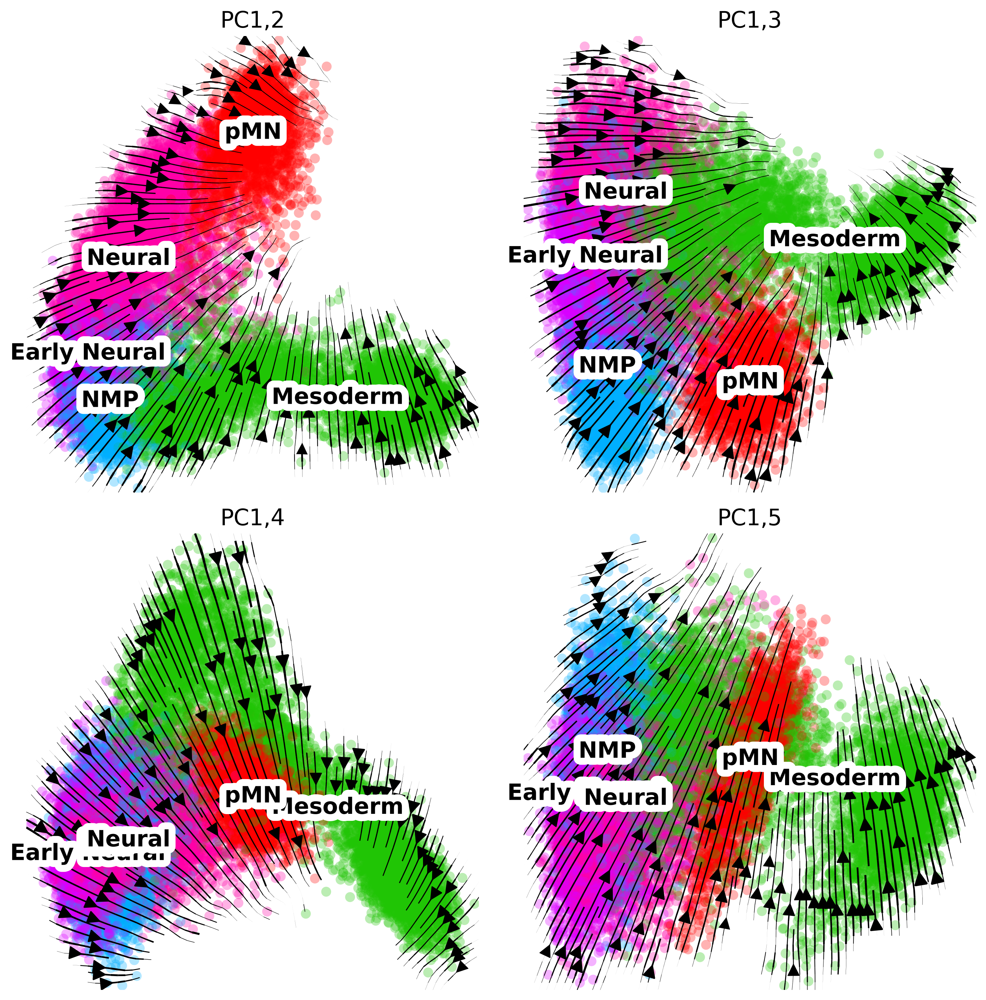

In [13]:
viz(model)

In [14]:
nmp = nmp.copy()

vt.ut.set_seed(0)

vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

model = vt.md.Velvet(
    nmp,
    n_latent = 50,
    linear_decoder = True,
    neighborhood_space="latent_space",
    biophysical_model = "full",
    gamma_mode = "learned",
    labelling_time = 2.0,
)

model.setup_model()    
start_time = time.time()
model.train(
    batch_size = nmp.shape[0],
    max_epochs = 1000, 
    freeze_vae_after_epochs = 200,
    constrain_vf_after_epochs = 0,
    lr=0.001,
)
end_time = time.time()
total_time = end_time - start_time

INFO     Generating sequential column names                                                                        


bypassing sigterm
bypassing sigterm
bypassing sigterm
Multiprocessing is handled by SLURM.
bypassing sigterm
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
bypassing sigterm
bypassing sigterm
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
SLURM auto-requeueing enabled. Setting signal handlers.


Epoch 1000/1000: 100%|██████████| 1000/1000 [05:15<00:00,  3.10it/s, loss=1.95, v_num=1]  

`Trainer.fit` stopped: `max_epochs=1000` reached.


Epoch 1000/1000: 100%|██████████| 1000/1000 [05:15<00:00,  3.17it/s, loss=1.95, v_num=1]


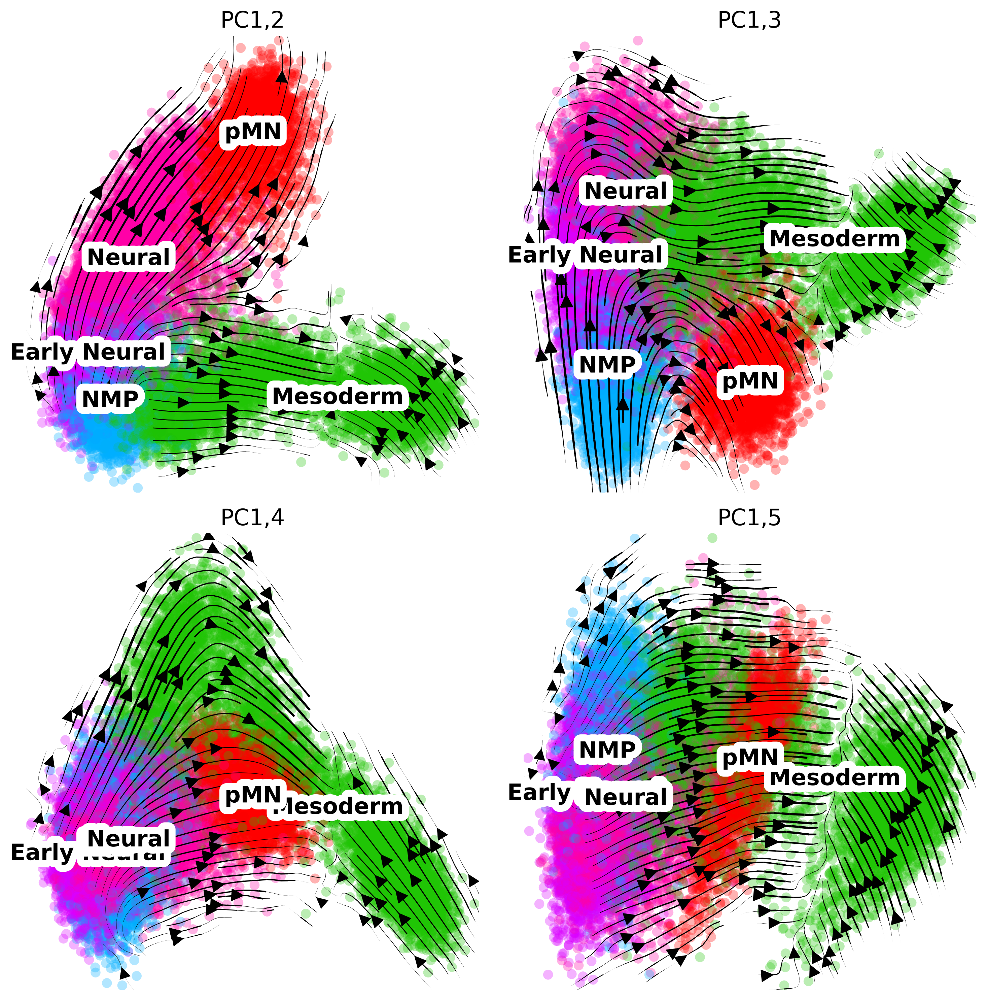

In [15]:
viz(model)

In [1]:
# batch_sizes = [int(a) for a in [neural.shape[0]/1024, neural.shape[0]/256, neural.shape[0]/64, neural.shape[0]/16,neural.shape[0]/4, neural.shape[0]]]

# for bs in batch_sizes:
#     nmp = nmp.copy()

#     vt.ut.set_seed(0)

#     vt.md.Velvet.setup_anndata(nmp, x_layer='total', n_layer='new', knn_layer='knn_index')

#     model = vt.md.Velvet(
#         nmp,
#         n_latent = 50,
#         linear_decoder = True,
#         neighborhood_space="latent_space",
#         biophysical_model = "full",
#         gamma_mode = "learned",
#         labelling_time = 2.0,
#     )

#     model.setup_model()    
#     start_time = time.time()
#     model.train(
#         batch_size = bs,
#         max_epochs = 1000, 
#         freeze_vae_after_epochs = 200,
#         constrain_vf_after_epochs = 200,
#         lr=0.001,
#     )
#     end_time = time.time()
#     total_time = end_time - start_time
#     viz(model, f'Batch size = {bs} / Training time = {total_time/60:.2f}m')